# Desafio: Onde está Wally?

## Importando bibliotecas

In [1]:
%matplotlib inline

import cv2
from matplotlib import pyplot as plt
import os
import numpy as np

## Definindo funções auxiliares

### Função que busca o maior retangulo identificado do wally

In [2]:
def get_maior_retangulo(retangulos):
    x, y, w, h = (0,0,0,0)
    for (x1,y1,w1,h1) in retangulos:
        if w1 + h1 > w + h:
            x, y, w, h = (x1,y1,w1,h1)
    return x, y, w, h

### Função para juntar os retangulos

In [3]:
def join_rectangles(rectangles):
    x_values = []
    y_values = []
    x_w_values = []
    y_h_values = []
    
    for (x, y, w, h) in rectangles:
        x_values.append(x)
        y_values.append(y)
        x_w_values.append(x + w)
        y_h_values.append(y + h)
        
    return min(x_values), min(y_values), max(x_w_values), max(y_h_values)

### Função para redimensionar imagens

In [4]:
def resize_image(img, percent):
    scale_percent = percent # percent of original size
    
    width = int(image.shape[1] * scale_percent / 100)
    height = int(image.shape[0] * scale_percent / 100)
    dim = (width, height)

    # resize image
    resized = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
    
    return resized

### Função para pegar o centróide do objeto identificado

In [5]:
def get_centroid_pts(x, y, w, h):
    x1 = int(w / 2)
    y1 = int(h / 2)
    cx = x + x1
    cy = y + y1
    
    return cx, cy

## Criando as imagens negativas

Essa função percorre as imagens de Treino, que possuem o personagem o wally, e remove esse personagem da imagem adicionando no lugar a médias dos valores de pixel Blue, Green, Red, no lugar do personagem.

In [6]:
import json 

def remove_wally(img_name, img_path, json_path, dir_path):
    img = cv2.imread(img_path) 

    f = open(json_path,) 
    data = json.load(f) 

    pts = data['shapes'][0]['points']

    if len(pts)==4:
        pts = np.array(data['shapes'][0]['points'], np.int32)

        pts = pts.reshape((-1,1,2))


        cv2.fillPoly(img, [pts], (np.mean(img[:, :, 0]),np.mean(img[:, :, 1]),np.mean(img[:, :, 2]))) 

        #convert to gray image 
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # save file
        cv2.imwrite(dir_path+img_name, gray_img) 
        
        # ploting images
        plt.imshow(gray_img)
        plt.show()


def create_neg_images():
    for img in os.listdir("./TrainingSet/"):
        if img.split(".")[1] == 'jpg':
            img_path = "./TrainingSet/" + img
            json_path = "./TrainingSet/" + img.split(".")[0] + ".json"
            dir_path = "./neg/"
            remove_wally(img, img_path, json_path, dir_path)
            
create_neg_images()

## Criando o arquivo de imagens positivas e convertendo as imagens para cinza

Essa função percorre as imagens de trei no e checa através do arquivo .json associado a cada imagem, quais contém polígono com pelo menos 4 pontos (menos que isso tratamos como um erro de treino). A partir daí é criado um retângulo que engloba esse polígono. Esse retângulo será utilizado para treinar o modelo.

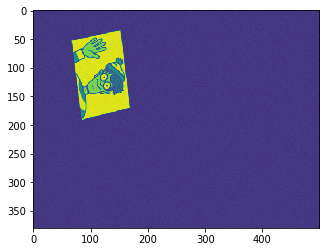

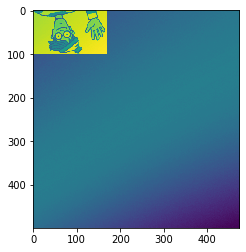

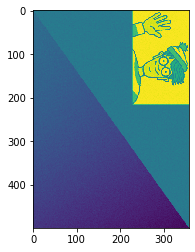

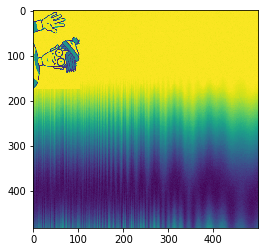

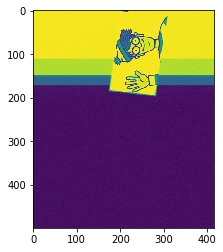

...

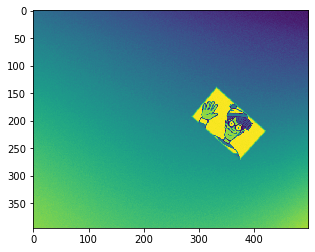

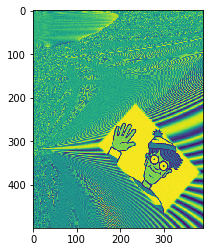

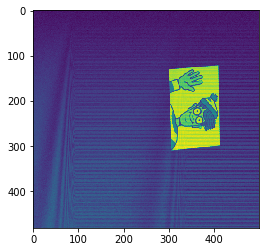

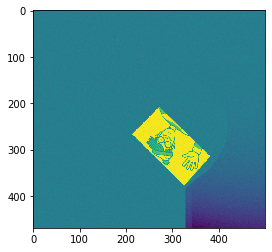

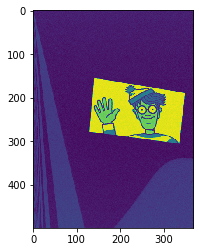

In [15]:
def create_pos_info(img_name, img_path, json_path, dir_path):

    img = cv2.imread(img_path) 

    f = open(json_path,) 
    data = json.load(f) 

    pts = data['shapes'][0]['points']

    line = ""

    if len(pts)>=4:
        pts = np.array(data['shapes'][0]['points'], np.int32)

        x_values = [i[0] for i in pts]
        y_values = [i[1] for i in pts]

        x_min, x_max, y_min, y_max = min(x_values), max(x_values), min(y_values), max(y_values)
        x, y, w, h  = x_min, y_min, x_max-x_min, y_max-y_min
        
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,0,0), 10)  

        # convert to gray image
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        #save image
        cv2.imwrite(dir_path+img_name, gray) 
        #ploting image
        plt.imshow(gray)
        plt.show()
        
        line = img_name+' 1 '+ " ".join([str(i) for i in [x_min,y_min,x_max-x_min,y_max-y_min]])+'\n'
    return line

def create_info_pos_file():
    line = ""
    
    for img in os.listdir("./TrainingSet/"):
        if img.split(".")[1] == 'jpg':
            img_path = "./TrainingSet/" + img
            json_path = "./TrainingSet/" + img.split(".")[0] + ".json"
            dir_path = "./NewTrainingSet/"
            line += create_pos_info(img, img_path, json_path, dir_path)
    
    #  write info pos file
    with open('./NewTrainingSet/info.txt','w') as f:
        f.write(line)

create_info_file()


## Processando a imagem do wally

Essa função converte e gera uma nova imagem do wally em tons de cinza.

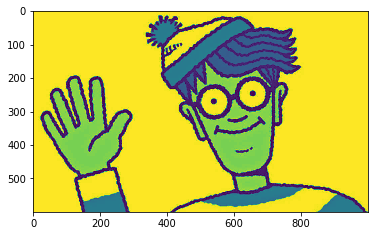

In [82]:
def process_wally_img():
    img_wally = cv2.imread("./ReferenceData/wally.jpg")
    
    #convert to gray
    gray = cv2.cvtColor(img_wally, cv2.COLOR_BGR2GRAY)
    #writing image
    cv2.imwrite("./ReferenceData/img_wally_gray.jpg", gray) 
    #ploting image
    plt.imshow(gray)
    plt.show()
    
process_wally_img()

## Criando o arquivo das imagens negativas

Esse função gera o arquivo bg.txt que é usado pelo script de treinamento do modelo para saber onde encontrar as imagens negativas.

In [83]:
def create_neg_file():
    for file_type in ['neg']:
        for img in os.listdir("./"+file_type):
          line = file_type+'/'+img+'\n'
          with open('./bg.txt','a') as f:
              f.write(line)

create_neg_file()

## Produzindo novas imagens de treino

Vamos gerar novas imagens de treino a partir das imagens negativas e da imagem do personagem wally. O que isso faz é criar amostras, com base no img que especificamos, bg é a informação de fundo (imagens negativas), info onde colocaremos a saída info.txt (que é muito parecida com o arquivo bg.txt), então o -pngoutput está onde quer que nós desejemos colocar as imagens recém-geradas.

In [18]:
!opencv_createsamples -img ./ReferenceData/img_wally_gray.jpg -bg ./bg.txt -info ./NewTrainingSet/info1.txt -pngoutput info -maxxangle 0.5 -maxyangle 0.5 -maxzangle 0.5 -num 200

Info file name: ./NewTrainingSet/info1.txt
Img file name: ./ReferenceData/img_wally_gray.jpg
Vec file name: (NULL)
BG  file name: ./bg.txt
Num: 200
BG color: 0
BG threshold: 80
Invert: FALSE
Max intensity deviation: 40
Max x angle: 0.5
Max y angle: 0.5
Max z angle: 0.5
Show samples: FALSE
Width: 24
Height: 24
Max Scale: -1
Create test samples from single image applying distortions...
Open background image: ./neg/wally_019.jpg
Open background image: ./neg/wally_026.jpg
Open background image: ./neg/wally_030.jpg
Open background image: ./neg/wally_050.jpg
Open background image: ./neg/wally_036.jpg
Open background image: ./neg/wally_121.jpg
Open background image: ./neg/wally_129.jpg
Open background image: ./neg/wally_037.jpg
Open background image: ./neg/wally_040.jpg
Open background image: ./neg/wally_113.jpg
Open background image: ./neg/wally_014.jpg
Open background image: ./neg/wally_020.jpg
Open background image: ./neg/wally_049.jpg
Open background image: ./neg/wally_137.jpg
Open backgr

## Juntando as imagens de treino novas com as antigas

Como já tinhamos gerado um arquivo info com as imagens de treino originais, vamos juntar as novas geradas!

In [91]:
def join_files():
    data = data1 = "" 
  
    # Reading data from info 
    with open('./NewTrainingSet/info.txt') as fp: 
        data = fp.read() 

    # Reading data from info1 
    with open('./NewTrainingSet/info1.txt') as fp: 
        data1 = fp.read() 

    # Merging 2 files 
    # To add the data of file2 
    # from next line 
    data += data1 

    with open ('./NewTrainingSet/info.txt', 'w') as fp: 
        fp.write(data)

join_files()

## Criando o arquivo vetorial das imagens positivas

Agora que temos imagens positivas, precisamos criar o arquivo vetorial, que é basicamente onde juntamos todas as nossas imagens positivas. Na verdade, usaremos opencv_createsamples novamente para isso!

In [19]:
!opencv_createsamples -info ./NewTrainingSet/info.txt -num 226 -w 24 -h 24 -vec ./positives.vec

Info file name: ./NewTrainingSet/info.txt
Img file name: (NULL)
Vec file name: ./positives.vec
BG  file name: (NULL)
Num: 313
BG color: 0
BG threshold: 80
Invert: FALSE
Max intensity deviation: 40
Max x angle: 1.1
Max y angle: 1.1
Max z angle: 0.5
Show samples: FALSE
Width: 24
Height: 24
Max Scale: -1
Create training samples from images collection...
./NewTrainingSet/info.txt(227) : parse errorDone. Created 226 samples


## Treinando o modelo

Aqui, dizemos para onde queremos que os dados vão, onde está o arquivo vetorial (imagens positivas), onde está o arquivo de fundo (imagens negativas), quantas imagens positivas e negativas usar, quantos estágios e a largura e altura. Observe que usamos significativamente menos numPos do que temos. Isso é para abrir espaço para os estágios, que vão se somar a isso.

In [39]:
!opencv_traincascade -data ./data -vec ./positives.vec -bg ./bg.txt  -numPos 200 -numNeg 100 -numStages 10 -w 24 -h 24  -maxFalseAlarmRate 0.001 -minHitRate: 0.999 

PARAMETERS:
cascadeDirName: ./data
vecFileName: ./positives.vec
bgFileName: ./bg.txt
numPos: 200
numNeg: 100
numStages: 10
precalcValBufSize[Mb] : 1024
precalcIdxBufSize[Mb] : 1024
acceptanceRatioBreakValue : -1
stageType: BOOST
featureType: HAAR
sampleWidth: 24
sampleHeight: 24
boostType: GAB
minHitRate: 0.995
maxFalseAlarmRate: 0.001
weightTrimRate: 0.95
maxDepth: 1
maxWeakCount: 100
mode: BASIC
Number of unique features given windowSize [24,24] : 162336

===== TRAINING 0-stage =====
<BEGIN
POS count : consumed   200 : 200
NEG count : acceptanceRatio    100 : 1
Precalculation time: 1
+----+---------+---------+
|  N |    HR   |    FA   |
+----+---------+---------+
|   1|        1|        1|
+----+---------+---------+
|   2|        1|     0.43|
+----+---------+---------+
|   3|        1|     0.46|
+----+---------+---------+
|   4|        1|     0.45|
+----+---------+---------+
|   5|        1|     0.16|
+----+---------+---------+
|   6|        1|     0.18|
+----+---------+---------+
| 

|  10|        1|     0.06|
+----+---------+---------+
|  11|        1|     0.02|
+----+---------+---------+
|  12|        1|     0.01|
+----+---------+---------+
|  13|        1|        0|
+----+---------+---------+
END>
Training until now has taken 0 days 0 hours 2 minutes 47 seconds.


## Avaliando o modelo

Vamos rodar o modelo treionado nos dados de teste para identificar qual a qualidade do modelo

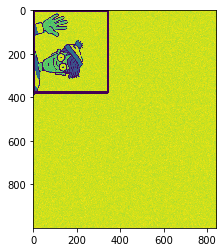

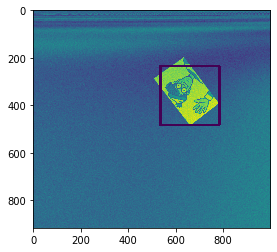

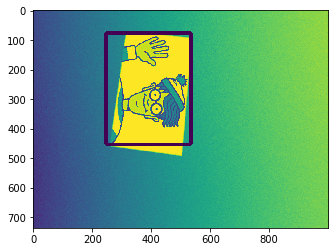

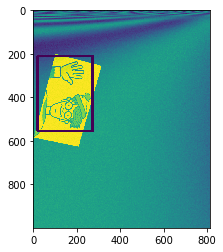

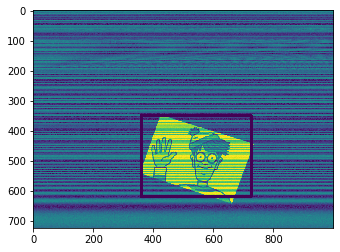

...

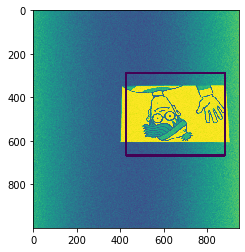

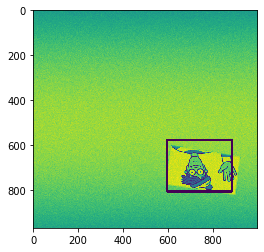

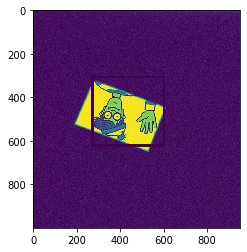

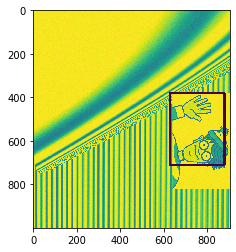

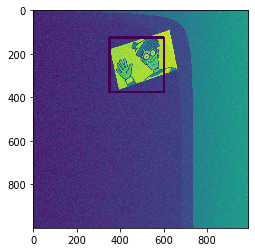

[['wally_062.jpg', 172, 191],
 ['wally_105.jpg', 658, 358],
 ['wally_058.jpg', 389, 265],
 ['wally_005.jpg', 147, 382],
 ['wally_139.jpg', 542, 484],
 ['wally_057.jpg', 360, 358],
 ['wally_016.jpg', 470, 432],
 ['wally_004.jpg', 786, 838],
 ['wally_078.jpg', 289, 389],
 ['wally_112.jpg', 107, 776],
 ['wally_149.jpg', 610, 224],
 ['wally_130.jpg', 501, 342],
 ['wally_070.jpg', 322, 145],
 ['wally_109.jpg', 386, 790],
 ['wally_041.jpg', 140, 533],
 ['wally_010.jpg', 616, 498],
 ['wally_063.jpg', 313, 180],
 ['wally_071.jpg', 467, 260],
 ['wally_103.jpg', 163, 205],
 ['wally_128.jpg', 142, 125],
 ['wally_021.jpg', 786, 668],
 ['wally_025.jpg', 722, 271],
 ['wally_051.jpg', 223, 362],
 ['wally_076.jpg', 709, 167],
 ['wally_118.jpg', 173, 346],
 ['wally_145.jpg', 653, 478],
 ['wally_079.jpg', 739, 692],
 ['wally_084.jpg', 437, 464],
 ['wally_114.jpg', 753, 545],
 ['wally_111.jpg', 475, 251]]

In [8]:
def where_is_wally():
    # Set our cascade classifier we created earlier
    CASCADE_FILE = './data/cascade.xml'

    results = []

    cascade = cv2.CascadeClassifier(CASCADE_FILE)

    for file_type in ['TestSet']:
        for img in os.listdir("./"+file_type):
            if img.split(".")[1] == "jpg": ## pegando apenas os arquivos de imagens
                img_path = "./"+file_type+"/"+img

                image = cv2.imread(img_path)
                # convert to gray scale
                gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                
                # dimensions
                width = int(image.shape[1])
                height = int(image.shape[0])
                
                
                # detecting rectangles
                rectangles = cascade.detectMultiScale(gray_image, scaleFactor=1.002, minNeighbors=18,
                  minSize=(25, 25),maxSize=(int(width*0.5), int(height*0.5)))

                cx, cy = 0,0 # centroid position

                if len(rectangles) > 0:
                    # Join multiples rectangles
                    x, y, x_plus_w, y_plus_h = join_rectangles(rectangles)
                    
                    if (x_plus_w - x) > width*0.6 or (y_plus_h - y) > height*0.6: #  If the function of joining the rectangles forms a very large rectangle, it would be better to take only the largest rectangle
                        x, y, w, h = get_maior_retangulo(rectangles)
                        cv2.rectangle(gray_image,(x,y),(x+w,y+h),(0,0,0), 10)  
                        cx, cy = get_centroid_pts(x, y, w, h)
                    else:
                        cv2.rectangle(gray_image,(x, y), (x_plus_w, y_plus_h),(0,0,0), 10)
                        cx, cy = get_centroid_pts(x, y, x_plus_w - x, y_plus_h - y)

                   

                results.append([img,cx,cy])

                # ploting images
                plt.imshow(gray_image)
                plt.show()

                #save image
                cv2.imwrite('./Results/'+img, gray_image)
                
    return results

where_is_wally()

## Salvando os resultados

In [9]:
def save_results():
    with open('Results/results.txt','w') as f:
        f.write("\n".join(" ".join([str(v) for v in values]) for values in results))